In [13]:
import os
import random
import shutil
import cv2
import matplotlib.pyplot as plt

from ultralytics import YOLO

from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction

In [12]:
!pip install ultralytics
!pip install -q sahi

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 9.5 MB/s eta 0:00:00


In [14]:
VAL_IMAGES = "/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/images"

LABEL_DIR = "/kaggle/input/datasets/aliabdelmenam/rdd-2022/RDD_SPLIT/val/labels"


YOLOV8M_PATH = "/kaggle/input/datasets/aadeeshsrivastava/yolov8m/best.pt"

YOLO11M_PATH = "/kaggle/input/datasets/aadeeshsrivastava/yolov8m/best.pt"

In [15]:
random.seed(42)

In [16]:
labeled_images = []

for label_file in os.listdir(LABEL_DIR):

    label_path = os.path.join(
        LABEL_DIR,
        label_file
    )

    if os.path.getsize(label_path) > 0:

        labeled_images.append(
            label_file.replace(".txt", ".jpg")
        )


print("Total labeled images:", len(labeled_images))

Total labeled images: 3921


In [17]:
random_samples = random.sample(
    labeled_images,
    5
)

print("Random Samples:\n")

for img in random_samples:
    print(img)

Random Samples:

Japan_009493.jpg
Norway_004326.jpg
Japan_000523.jpg
United_States_002219.jpg
United_States_002593.jpg


In [18]:
india_images = [

    img

    for img in labeled_images

    if img.startswith("India")

]


print("Indian Images:", len(india_images))

Indian Images: 570


In [19]:
india_samples = random.sample(
    india_images,
    5
)

print("Indian Samples:\n")

for img in india_samples:
    print(img)

Indian Samples:

India_000646.jpg
India_007606.jpg
India_003642.jpg
India_001454.jpg
India_007084.jpg


In [20]:
with open(
    "/kaggle/working/sample_images.txt",
    "w"
) as f:

    f.write("=== RANDOM SAMPLES ===\n")

    for img in random_samples:
        f.write(img + "\n")


    f.write("\n=== INDIA SAMPLES ===\n")

    for img in india_samples:
        f.write(img + "\n")


print("Saved!")

Saved!


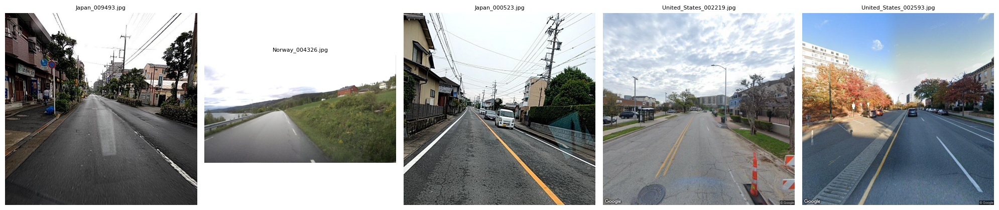

In [21]:
fig, axes = plt.subplots(
    1,
    5,
    figsize=(20,5)
)

for ax, image_name in zip(
    axes,
    random_samples
):

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    image = cv2.imread(image_path)

    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    ax.imshow(image)

    ax.set_title(
        image_name,
        fontsize=8
    )

    ax.axis("off")


plt.tight_layout()
plt.show()

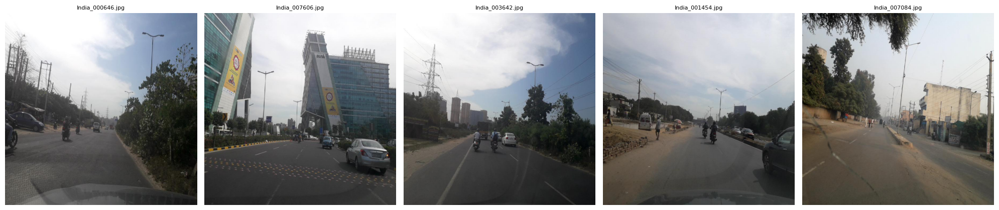

In [22]:
fig, axes = plt.subplots(
    1,
    5,
    figsize=(20,5)
)

for ax, image_name in zip(
    axes,
    india_samples
):

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    image = cv2.imread(image_path)

    image = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2RGB
    )

    ax.imshow(image)

    ax.set_title(
        image_name,
        fontsize=8
    )

    ax.axis("off")


plt.tight_layout()
plt.show()

In [23]:
FINAL_SAMPLES = [
    # Global
    "Japan_009493.jpg",
    "Japan_000523.jpg",
    "United_States_002219.jpg",
    "United_States_002593.jpg",

    # India
    "India_003642.jpg",
    "India_001454.jpg",
    "India_007084.jpg",
    "India_000646.jpg"
]

In [24]:
yolov8m = YOLO(YOLOV8M_PATH)
yolov11m = YOLO(YOLO11M_PATH)

print("Models loaded successfully!")

Models loaded successfully!


In [25]:
from sahi import AutoDetectionModel

yolov8m_sahi = AutoDetectionModel.from_pretrained(
    model_type="ultralytics",
    model_path=YOLOV8M_PATH,
    confidence_threshold=0.25,
    device="cuda:0"
)

yolov11m_sahi = AutoDetectionModel.from_pretrained(
    model_type="ultralytics",
    model_path=YOLO11M_PATH,
    confidence_threshold=0.25,
    device="cuda:0"
)

In [26]:
import os

OUTPUT_DIR = "/kaggle/working/model_family_comparison"

os.makedirs(
    OUTPUT_DIR,
    exist_ok=True
)

In [27]:
from PIL import Image


def save_yolo_prediction(
    model,
    image_path,
    save_path
):

    result = model.predict(
        image_path,
        conf=0.25,
        verbose=False
    )[0]

    plotted = result.plot()

    Image.fromarray(plotted).save(save_path)

In [31]:
from sahi.predict import get_sliced_prediction


def save_sahi_prediction(
    detection_model,
    image_path,
    save_path
):

    result = get_sliced_prediction(
        image_path,
        detection_model,
        slice_height=512,
        slice_width=512,
        overlap_height_ratio=0.2,
        overlap_width_ratio=0.2,
        verbose=0
    )

    result.export_visuals(
        export_dir=os.path.dirname(save_path)
    )

    print("Saved SAHI prediction")

In [32]:
import shutil

for image_name in FINAL_SAMPLES:

    print(f"Processing {image_name}")

    image_path = os.path.join(
        VAL_IMAGES,
        image_name
    )

    image_folder = os.path.join(
        OUTPUT_DIR,
        image_name.replace(".jpg", "")
    )

    os.makedirs(
        image_folder,
        exist_ok=True
    )

    # Original image
    shutil.copy(
        image_path,
        os.path.join(
            image_folder,
            "original.jpg"
        )
    )

    # YOLOv8m
    save_yolo_prediction(
        yolov8m,
        image_path,
        os.path.join(
            image_folder,
            "yolov8m.png"
        )
    )

    # YOLOv8m + SAHI
    save_sahi_prediction(
        yolov8m_sahi,
        image_path,
        os.path.join(
            image_folder,
            "yolov8m_sahi.png"
        )
    )

    # YOLO11m
    save_yolo_prediction(
        yolov11m,
        image_path,
        os.path.join(
            image_folder,
            "yolov11m.png"
        )
    )

    # YOLO11m + SAHI
    save_sahi_prediction(
        yolov11m_sahi,
        image_path,
        os.path.join(
            image_folder,
            "yolov11m_sahi.png"
        )
    )

print("\nDone!")

Processing Japan_009493.jpg
Saved SAHI prediction
Saved SAHI prediction
Processing Japan_000523.jpg
Saved SAHI prediction
Saved SAHI prediction
Processing United_States_002219.jpg
Saved SAHI prediction
Saved SAHI prediction
Processing United_States_002593.jpg
Saved SAHI prediction
Saved SAHI prediction
Processing India_003642.jpg
Saved SAHI prediction
Saved SAHI prediction
Processing India_001454.jpg
Saved SAHI prediction
Saved SAHI prediction
Processing India_007084.jpg
Saved SAHI prediction
Saved SAHI prediction
Processing India_000646.jpg
Saved SAHI prediction
Saved SAHI prediction

Done!


In [36]:
import os
import matplotlib.pyplot as plt
from PIL import Image

SIDE_BY_SIDE_DIR = "/kaggle/working/side_by_side_comparisons"
os.makedirs(SIDE_BY_SIDE_DIR, exist_ok=True)


def visualize_sample(image_name):

    folder = os.path.join(
        OUTPUT_DIR,
        image_name.replace(".jpg", "")
    )

    files = sorted(os.listdir(folder))

    fig, axes = plt.subplots(
        1,
        len(files),
        figsize=(28, 7)
    )

    for ax, file in zip(axes, files):

        img = Image.open(
            os.path.join(folder, file)
        )

        ax.imshow(img)

        ax.set_title(
            file.replace(".png", "")
                .replace(".jpg", "")
                .replace("_", " ")
        )

        ax.axis("off")

    plt.suptitle(
        image_name,
        fontsize=16
    )

    plt.tight_layout()

    # SAVE THE SAME VISUALIZATION
    save_path = os.path.join(
        SIDE_BY_SIDE_DIR,
        image_name.replace(".jpg", "_comparison.png")
    )

    plt.savefig(
        save_path,
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()

    plt.close()

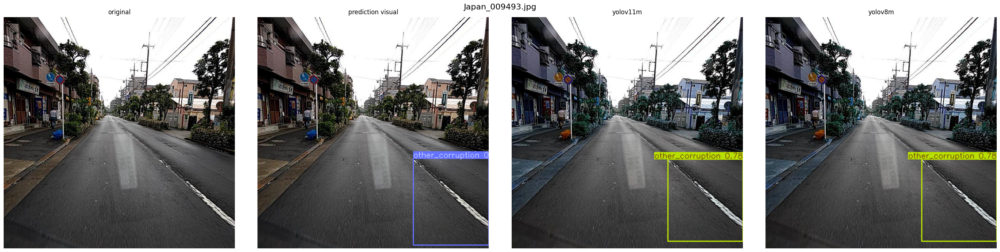

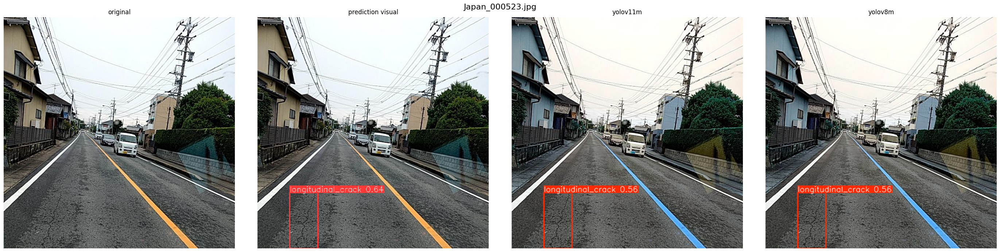

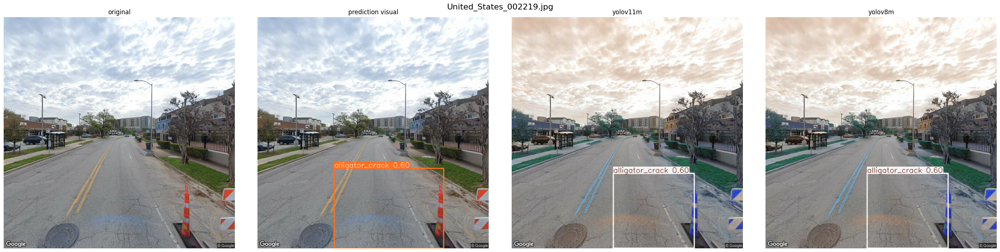

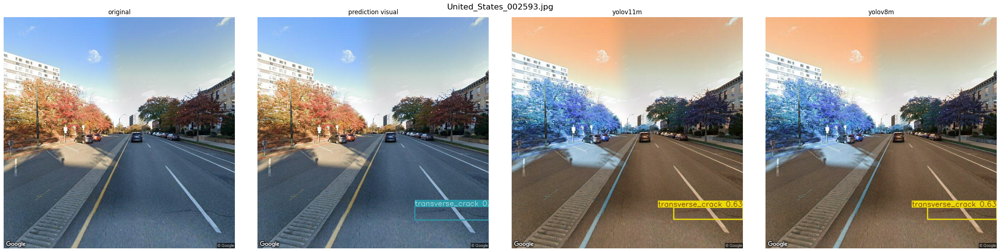

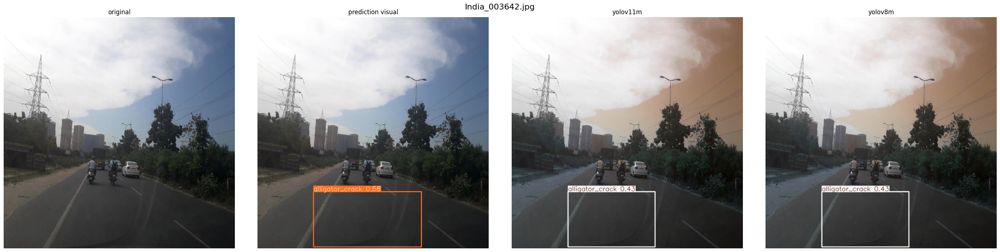

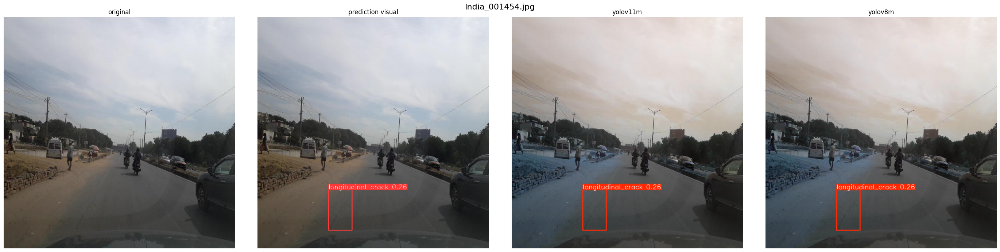

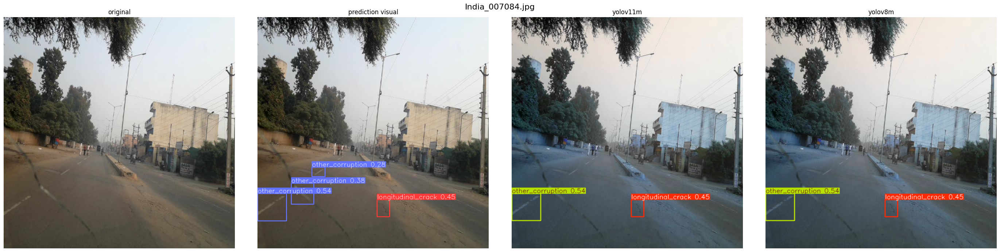

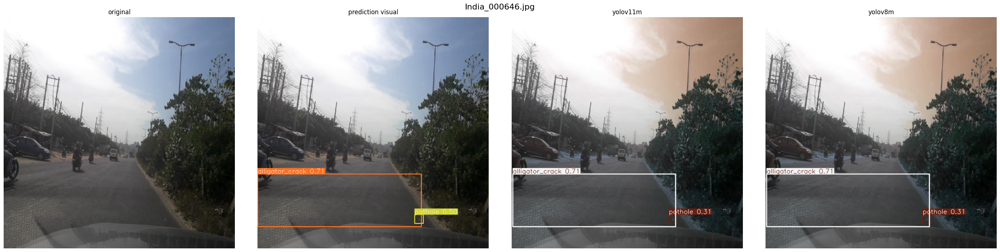

In [37]:
for sample in FINAL_SAMPLES:
    visualize_sample(sample)

In [38]:
!zip -r side_by_side_comparisons.zip /kaggle/working/side_by_side_comparisons

  adding: kaggle/working/side_by_side_comparisons/ (stored 0%)
  adding: kaggle/working/side_by_side_comparisons/India_001454_comparison.png (deflated 3%)
  adding: kaggle/working/side_by_side_comparisons/Japan_000523_comparison.png (deflated 11%)
  adding: kaggle/working/side_by_side_comparisons/India_007084_comparison.png (deflated 3%)
  adding: kaggle/working/side_by_side_comparisons/Japan_009493_comparison.png (deflated 11%)
  adding: kaggle/working/side_by_side_comparisons/India_003642_comparison.png (deflated 3%)
  adding: kaggle/working/side_by_side_comparisons/United_States_002219_comparison.png (deflated 2%)
  adding: kaggle/working/side_by_side_comparisons/United_States_002593_comparison.png (deflated 2%)
  adding: kaggle/working/side_by_side_comparisons/India_000646_comparison.png (deflated 4%)
